## Analyse des sentiments et positions géopolitiques dans les commentaires Reddit sur le conflit Israélo-Palestinien

## **Introduction :**

Dans ce carnet Kaggle, nous plongeons dans le monde du discours en ligne entourant le conflit Israélo-Palestinien. En analysant les commentaires Reddit, notre objectif est de décrypter les sentiments et les positions géopolitiques des utilisateurs participant à ces discussions. En utilisant des techniques de Traitement du Langage Naturel (NLP), nous entreprenons un voyage multifacette :

1. **Exploration et Nettoyage des Données :**
   - Nous commençons par charger les commentaires Reddit à partir d'un fichier CSV et utilisons des méthodes rigoureuses de nettoyage des données. Cela comprend la suppression des URL, des balises HTML, des caractères spéciaux et l'utilisation de la lemmatisation pour la normalisation du texte.



2. **Analyse des Sentiments :**
   - En utilisant l'outil d'analyse des sentiments VADER, nous évaluons le ton émotionnel de chaque commentaire. Quatre principales mesures de sentiment - Composé, Positif, Négatif et Neutre - sont calculées, offrant une compréhension nuancée des sentiments des utilisateurs.



3. **Analyse Exploratoire des Données :**
   - À travers des techniques de visualisation telles que les graphiques de densité et les nuages de mots, nous représentons visuellement les distributions de sentiments. Cela nous aide à identifier les sentiments positifs, négatifs et neutres prédominants au sein de l'ensemble de données.



4. **Modélisation de Thèmes :**
   - En utilisant l'Allocation de Dirichlet Latente (LDA), une technique populaire de modélisation de thèmes, nous découvrons les thèmes latents au sein des commentaires. Cette étape aide à comprendre les thèmes sous-jacents qui dominent les discussions.



5. **Classification des Positions Géopolitiques :**
   - En combinant les scores de sentiment et les thèmes dominants, nous classifions les commentaires en positions géopolitiques distinctes. Les utilisateurs sont catégorisés en fonction de leurs sentiments - soutien à Israël, soutien à la Palestine, opposition à Israël/Palestine, ou une position neutre où la position de l'utilisateur reste ambiguë.



In [2]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import re
import numpy as np
from bs4 import BeautifulSoup
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [5]:
# Read data from CSV file
df = pd.read_csv(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\reddit_opinion_PSE_ISR.csv')

C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\537273016.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\reddit_opinion_PSE_ISR.csv')


# Data Exploration and Cleaning

In [6]:
df.sample(5)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
41663,kjjr8mu,2,"Compared to the state of the US, I think I sta...",Palestine,2024-01-25 19:38:22,19ej9av,deram_scholzara,0,2,0,...,447.0,2152.0,2619.0,1347,NaN,"""If we destroy all of Gaza, what is the lost t...",0.96,1347,0,2024-01-24 15:10:10
56084,kj7rl45,18,How can you make them dissappear by force when...,worldnews,2024-01-23 16:44:26,19dp69r,tiredoftheworldsbs,0,18,0,...,1.0,4018.0,4019.0,2555,NaN,Hamas rejects Israel's cease-fire proposal - r...,0.85,2555,0,2024-01-23 14:05:58
731425,k8c558f,1,Just gonna... Pop [this](https://www.reddit.co...,IsraelPalestine,2023-11-08 09:36:42,17q4xfn,Special-Quantity-469,0,1,0,...,1336.0,5680.0,7064.0,9,"I will address the Israeli perspective, and ev...",Why Israel is Killing Civilians,0.65,9,0,2023-11-07 21:24:53
479977,kbfygg4,3,Causually laughing while admitting to war crim...,worldnewsvideo,2023-11-30 19:20:13,187d986,Expo_Boomin,0,3,0,...,5636.0,8823.0,14794.0,463,NaN,Old Israeli soldiers tell about the heroics th...,0.93,463,0,2023-11-30 07:54:44
285550,ke89xn8,-9,"These guys are an actual military, you dont kn...",worldnews,2023-12-20 20:39:40,18mzsro,Aware-Competition804,0,-9,0,...,89.0,2059.0,2148.0,191,NaN,Yemen's Houthis Reveal General Mobilization Ac...,0.84,191,0,2023-12-20 17:18:30


In [8]:
for i in range(10):
    print(df.self_text[i])

Ok cute sentiment but also very short sighted and blind hope…what’s the point of exchanging captives when Israel literally killed the people they released that same night and then captured the same amount of ppl they released in the West Bank that same night too…it’s all so short sighted…this is the issue with Arab politics in general. It’s like the politicians and the ppl themselves are so naive and genuinly think the end goal isn’t their complete extermination when tbh that’s the wests goal with Palestinians specifically…
Yea Skor bars are nice, extremely underrated
Narrator: they did not.
Thank you! I was trying to find this
Exactly. Get them together in a room at a known location.
man this is called sarcasm
I'm not your history teacher, nor do I fundamentally care what your opinion is but I'm feeling charitable.


Here are the details, simply:




- Egypt blocked Israel vessels from the suez canal and straits of Tiran in 1949.
- Israel wasn't having it and took the Sinai peninsula 

In [9]:
# !unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

In [10]:
# Initialize the lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    
    # Remove HTML tags
    soup = BeautifulSoup(text, 'html.parser')
    text = soup.get_text()
    
    # Remove special characters and lowercase the text
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text).lower()
    
    # Tokenization
    tokens = word_tokenize(text)
    
    # Lemmatization and removing stopwords
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]
    
    # Join the tokens back into a sentence
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

# Example usage on 'self_text' column of your DataFrame
df['self_text_str'] = df['self_text'].astype(str)
df['clean_text'] = df['self_text_str'].apply(clean_text)


C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\3191372344.py:10: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(text, 'html.parser')


In [11]:
for i in range(10):
    print(df.clean_text[i])

ok cute sentiment also short sighted blind hopewhats point exchanging captive israel literally killed people released night captured amount ppl released west bank night tooits short sightedthis issue arab politics general like politician ppl naive genuinly think end goal isnt complete extermination tbh thats west goal palestinian specifically
yea skor bar nice extremely underrated
narrator
thank trying find
exactly get together room known location
man called sarcasm
im history teacher fundamentally care opinion im feeling charitable detail simply egypt blocked israel vessel suez canal strait tiran 1949 israel wasnt took sinai peninsula allow ship hit sea 1957 israel withdrew sinai peninsula 1957 israel warned egypt closed strait tiran would act war apparently egypt didnt learn lesson moved bunch soldier border closed strait israel waxed egypt rebook peninsula returned 1979 draw whatever conclusion want

must worked past people let way deescalate make someone el problem line forgot rule

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790055 entries, 0 to 790054
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   comment_id                  790055 non-null  object 
 1   score                       790055 non-null  int64  
 2   self_text                   790051 non-null  object 
 3   subreddit                   790055 non-null  object 
 4   created_time                790055 non-null  object 
 5   post_id                     790055 non-null  object 
 6   author_name                 790055 non-null  object 
 7   controversiality            790055 non-null  int64  
 8   ups                         790055 non-null  int64  
 9   downs                       790055 non-null  int64  
 10  user_is_verified            790053 non-null  object 
 11  user_account_created_time   767121 non-null  object 
 12  user_awardee_karma          789965 non-null  float64
 13  user_awarder_k

# Sentiment Analysis using VADER

In [13]:
# Initialize the Sentiment Intensity Analyzer
import nltk
nltk.download('vader_lexicon')

analyzer = SentimentIntensityAnalyzer()

# Declare variables for scores
scores = {
    "Compound": [],
    "Positive": [],
    "Negative": [],
    "Neutral": []
}

# Generate sentiment scores for Reddit comments
for comment in df['clean_text']:
    compound = analyzer.polarity_scores(comment)["compound"]
    pos = analyzer.polarity_scores(comment)["pos"]
    neu = analyzer.polarity_scores(comment)["neu"]
    neg = analyzer.polarity_scores(comment)["neg"]
    
    scores["Compound"].append(compound)
    scores["Positive"].append(pos)
    scores["Negative"].append(neg)
    scores["Neutral"].append(neu)

# Create a new DataFrame for sentiment scores
sentiments_score = pd.DataFrame(scores)

# Join the sentiment scores DataFrame with the original DataFrame
df = pd.concat([df, sentiments_score], axis=1)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [14]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral
0,kon47ca,1,Ok cute sentiment but also very short sighted ...,Palestine,2024-02-02 20:49:25,1ah01cs,Lolilio2,0,1,0,...,0.98,637,0,2024-02-02 09:44:49,Ok cute sentiment but also very short sighted ...,ok cute sentiment also short sighted blind hop...,-0.3818,0.131,0.158,0.712
1,kon457r,1,"Yea Skor bars are nice, extremely underrated",worldnews,2024-02-02 20:49:05,1ah35xu,Poofshu,0,1,0,...,0.90,298,0,2024-02-02 13:02:45,"Yea Skor bars are nice, extremely underrated",yea skor bar nice extremely underrated,0.4215,0.359,0.000,0.641
2,kon447n,1,Narrator: they did not.,IsraelPalestine,2024-02-02 20:48:56,1agztmw,Traditional-Fan-9315,0,1,0,...,0.68,38,0,2024-02-02 09:29:21,Narrator: they did not.,narrator,0.0000,0.000,0.000,1.000
3,kon444j,1,Thank you! I was trying to find this,IsraelPalestine,2024-02-02 20:48:55,1ah6jnu,Ok_Presentation_2501,0,1,0,...,0.86,35,0,2024-02-02 15:38:58,Thank you! I was trying to find this,thank trying find,0.3612,0.556,0.000,0.444
4,kon446a,1,Exactly. Get them together in a room at a know...,worldnews,2024-02-02 20:48:55,1ah91mc,TenaciousChicken,0,1,0,...,0.81,327,0,2024-02-02 17:25:16,Exactly. Get them together in a room at a know...,exactly get together room known location,0.0000,0.000,0.000,1.000


In [15]:
# Define conditions for sentiment categories based on 'Compound' scores
# If Compound score is <= -0.5, classify as 'Negative'
# If Compound score is > -0.5 and < 0.5, classify as 'Neutral'
# If Compound score is >= 0.5, classify as 'Positive'
conditions = [
    (df['Compound'] <= -0.5),
    (df['Compound'] > -0.5) & (df['Compound'] < 0.5),
    (df['Compound'] > 0.5)
]

# Define corresponding values for each condition
values = ['Negative', 'Neutral', 'Positive']

# Create a new column 'Category' using np.select to assign values based on the conditions
df['Category'] = np.select(conditions, values)

In [16]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
0,kon47ca,1,Ok cute sentiment but also very short sighted ...,Palestine,2024-02-02 20:49:25,1ah01cs,Lolilio2,0,1,0,...,637,0,2024-02-02 09:44:49,Ok cute sentiment but also very short sighted ...,ok cute sentiment also short sighted blind hop...,-0.3818,0.131,0.158,0.712,Neutral
1,kon457r,1,"Yea Skor bars are nice, extremely underrated",worldnews,2024-02-02 20:49:05,1ah35xu,Poofshu,0,1,0,...,298,0,2024-02-02 13:02:45,"Yea Skor bars are nice, extremely underrated",yea skor bar nice extremely underrated,0.4215,0.359,0.000,0.641,Neutral
2,kon447n,1,Narrator: they did not.,IsraelPalestine,2024-02-02 20:48:56,1agztmw,Traditional-Fan-9315,0,1,0,...,38,0,2024-02-02 09:29:21,Narrator: they did not.,narrator,0.0000,0.000,0.000,1.000,Neutral
3,kon444j,1,Thank you! I was trying to find this,IsraelPalestine,2024-02-02 20:48:55,1ah6jnu,Ok_Presentation_2501,0,1,0,...,35,0,2024-02-02 15:38:58,Thank you! I was trying to find this,thank trying find,0.3612,0.556,0.000,0.444,Neutral
4,kon446a,1,Exactly. Get them together in a room at a know...,worldnews,2024-02-02 20:48:55,1ah91mc,TenaciousChicken,0,1,0,...,327,0,2024-02-02 17:25:16,Exactly. Get them together in a room at a know...,exactly get together room known location,0.0000,0.000,0.000,1.000,Neutral


# Exploratory Data Analysis

In [17]:
# Group the DataFrame by 'Category' and count the occurrences of each category
category_counts = df.groupby(['Category'])['Category'].count()

# Create a DataFrame with counts and rename the column to 'Counts'
counts_df = pd.DataFrame(category_counts).rename(columns={"Category": "Counts"})

# Calculate the percentage for each category and add it as a new column 'Percentage'
counts_df['Percentage'] = (counts_df['Counts'] / counts_df['Counts'].sum()) * 100

counts_df = counts_df.drop(index='0')

# Print or return the summary DataFrame
print(counts_df)

          Counts  Percentage
Category                    
Negative  223541   28.294359
Neutral   441055   55.825860
Positive  125426   15.875604


In [18]:
counts_df

,Counts,Percentage
Category,,
Negative,223541,28.294359
Neutral,441055,55.825860
Positive,125426,15.875604


### Pie Chart of Sentiment Counts

In [19]:
import plotly.express as px

# Create a Pie Chart using Plotly
fig = px.pie(counts_df, values='Counts', names=counts_df.index, 
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Distribution of Sentiment Categories in Comments',
             hole=0.3, 
             color_discrete_sequence=px.colors.qualitative.Set1)

# Set the background color of the Pie Chart to dark grey
fig.update_layout(paper_bgcolor='darkgrey')


# Show the Plotly Pie Chart
fig.show()


In [20]:
import plotly.graph_objects as go

# Define data for the Pie Chart
data = [
    go.Pie(
        labels=counts_df.index,
        values=counts_df['Counts'],
        hole=0.3,
        title='Distribution of Sentiment Categories in Comments',
        marker=dict(colors=px.colors.qualitative.Set1)
    )
]

# Define layout for the Pie Chart
layout = go.Layout(
    paper_bgcolor='darkgrey',
    title='Distribution of Sentiment Categories in Comments'
)

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Show the Plotly Pie Chart
fig.show()


`Variation du nombre des commentaires en fonction du temps`

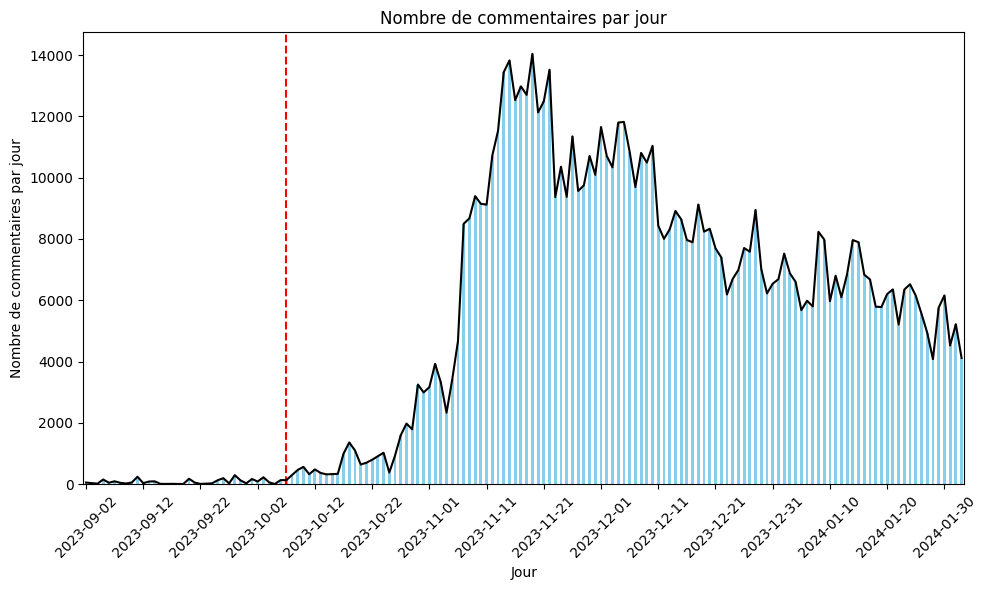

In [120]:
'''================================code diali===========================================
nombre de commentaire par jour'''
import pandas as pd
import matplotlib.pyplot as plt

# convert created_time to datetime using pd.to_datetime
df['created_time_good_format'] = pd.to_datetime(df['created_time'])
df['day'] = pd.to_datetime(df['created_time_good_format'], format='%d/%m/%y')
df['day'] = df['day'].dt.to_period('D')

# Grouper les lignes par la colonne 'day' et compter le nombre correspondant pour chaque jour
counts_per_day = df.groupby('day').size()

# Ploter le résultat
fig, ax = plt.subplots(figsize=(10, 6))

# Plot normal
counts_per_day.plot(kind='bar', color='skyblue', ax=ax)

# Ajouter des étiquettes et un titre au plot
ax.set_xlabel('Jour')
ax.set_ylabel('Nombre de commentaires par jour')
ax.set_title('Nombre de commentaires par jour')

ax.set_ylim(0)
# Afficher uniquement 10 dates sur l'axe x
n = 15
ticks = ax.xaxis.get_ticklocs()
ticklabels = [l.get_text() for l in ax.xaxis.get_ticklabels()]
ax.xaxis.set_ticks(ticks[::len(ticks)//n])
ax.xaxis.set_ticklabels(ticklabels[::len(ticklabels)//n])

# Mettre en évidence la date du 7 octobre 2023
highlight_date = '2023-10-07'
highlight_index = counts_per_day.index.get_loc(highlight_date)
ax.patches[highlight_index].set_facecolor('orange')

# Ajouter une ligne verticale en pointillé pour la date du 7 octobre 2023
ax.axvline(x=highlight_index, linestyle='--', color='red')

# Ajouter une ligne reliant les sommets de chaque barre
x_values = [i for i in range(len(counts_per_day))]
y_values = counts_per_day.values
ax.plot(x_values, y_values, color='black')

# Afficher le plot
plt.xticks(rotation=45)  # rotation des étiquettes de l'axe x pour une meilleure lisibilité
plt.tight_layout()  # Ajuster la mise en page pour s'assurer que tout est visible
plt.show()


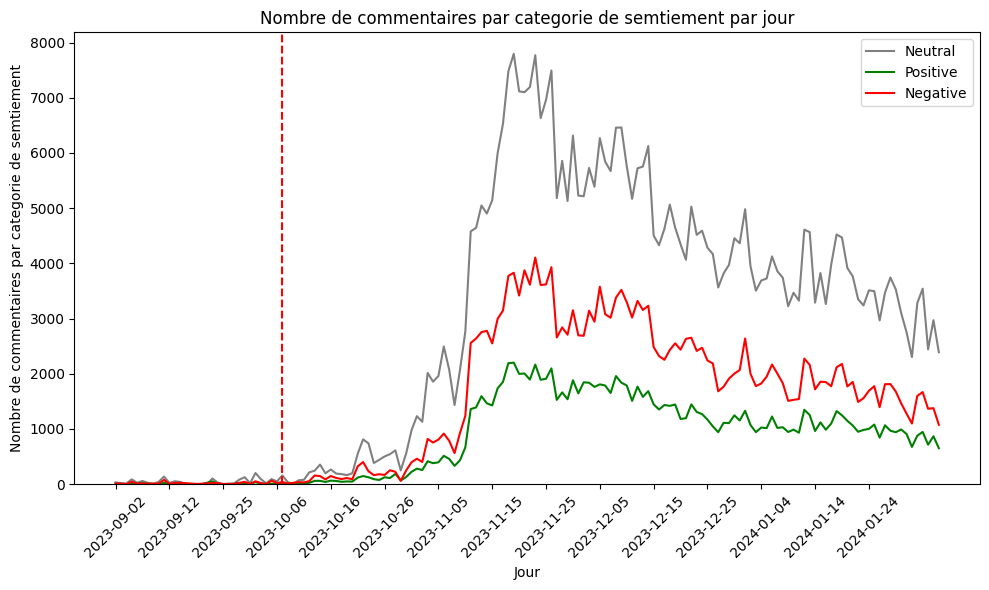

In [121]:
'''==================nombre de comentaire par categorie de sentiment par jour========================='''
# Grouper les lignes par la colonne 'day' et compter le nombre correspondant pour chaque jour

positive_per_day = df[df['Category'] == 'Positive'].groupby('day').size()
negative_per_day = df[df['Category'] == 'Negative'].groupby('day').size()
neutral_per_day = df[df['Category'] == 'Neutral'].groupby('day').size()
# Identifiez l'indice correspondant à la date du 7 octobre 2023
highlight_date = '2023-10-07'
highlight_index_p = positive_per_day.index.get_loc(highlight_date)
highlight_index_n = negative_per_day.index.get_loc(highlight_date)
highlight_index_ne = neutral_per_day.index.get_loc(highlight_date)

# Plotez le résultat
fig, ax = plt.subplots(figsize=(10, 6))

# Convertir les index en chaînes de caractères




x_values_ne = neutral_per_day.index.astype(str)
y_values_ne = neutral_per_day.values
ax.plot(x_values_ne, y_values_ne, color='grey', label='Neutral')

x_values_p = positive_per_day.index.astype(str)
y_values_p = positive_per_day.values
ax.plot(x_values_p, y_values_p, color='g', label='Positive')

x_values_n = negative_per_day.index.astype(str)
y_values_n = negative_per_day.values
ax.plot(x_values_n, y_values_n, color='r', label='Negative')

# Ajouter des étiquettes et un titre au plot
ax.set_xlabel('Jour')
ax.set_ylabel('Nombre de commentaires par categorie de semtiement')
ax.set_title('Nombre de commentaires par categorie de semtiement par jour')

# Ajouter une ligne verticale en pointillé pour la date du 7 octobre 2023
ax.axvline(x=highlight_index_p, linestyle='--', color='red')

ax.set_ylim(0)
# Afficher uniquement 10 dates sur l'axe x
n = 15
x_indices = range(0, len(x_values_p), len(x_values_p) // n)
x_labels = [x_values_p[i] for i in x_indices]
plt.xticks(x_indices, x_labels, rotation=45)

plt.tight_layout()  # Ajuster la mise en page pour s'assurer que tout est visible
plt.legend()  # Ajouter une légende
plt.show()


### Positive Score Comments

In [21]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_pos_comments = df.nlargest(n=50, columns=['Compound'])["clean_text"]

# This line selects the top 50 comments based on their 'Compound' scores,
# indicating the 50 comments with the most positive sentiment.


print(top_50_pos_comments)

# print top 5
# for com in top_50_pos_comments:
#     print(com, "\n")


89522     100 generation ago realize person great great ...
94147     israeli terrorised palestinias decade palestin...
529275    right exist place great great great great grea...
201068    flimsy say god promised land israel people tho...
262795    1 far know pa pna interchangeable however name...
255385    letter dr theodore herz youssuf zia alkhalidi ...
718029    cool agree clear definition whats terrorist wh...
406912    anyone think know might sound like basic quest...
437321    wow wow wow wow wow wow wow wow wow wow wow wo...
725662    lot dive since wont click link ill summarize y...
44723     guy grecian men fucking men sadly boy jesus ev...
150799    population density whether unified arab state ...
383263    palestine free exactly plan freedom plan impro...
587315    united state benefit helping israel number way...
194845    part 12 israelipalestinian interim agreement s...
295551    iron wall belief zionist use overwhelming forc...
440788    short version basically reime 

In [61]:
"""============================================code diali=================================================="""
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_pos_comments = df.nlargest(n=50, columns=['Compound'])

# Créer une liste pour stocker les résultats
positive_list = []

# Itérer sur les 50 commentaires sélectionnés et stocker les informations dans la liste
for index, row in top_50_pos_comments.iterrows():
    comment_id = row['id']
    comment_text = row['self_text']
    compound_value = row['Compound']
    
    # Créer un dictionnaire pour stocker les informations de chaque commentaire
    comment_info = {
        'ID': comment_id,
        'Comment': comment_text,
        'Compound Value': compound_value
    }
    
    # Ajouter le dictionnaire à la liste des résultats
    positive_list.append(comment_info)

# Créer un DataFrame à partir de la liste des résultats
positive_df = pd.DataFrame(positive_list)

# Afficher le DataFrame
positive_df.head(20)

positive_df.to_excel(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\positive.xlsx', index=False)

### Negative Score Comments

In [22]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_neg_comments = df.nsmallest(n=50, columns=['Compound'])["clean_text"]

print(top_50_neg_comments)

## print top 5
# for com in top_50_neg_comments:
#     print(com, "\n")

307343    please tell palestine bravely courageously res...
161959    realize perception medium analyst demonstrated...
203839    war gazza one worst death count recent conflic...
222793    thank source read every one article also read ...
511043    game want play problem 1948 thru 1967 jan 1 19...
522261    small partial list 1 prison throwing bombincen...
527857    pro palestinian clutched pearl necklace exclai...
537056    israel releasing innocent people saw lot peopl...
546957    here smalll portion list prisoner exchanged ho...
587349    impression town people didnt fight back slaugh...
719704    yeah almost every palestinian death riot went ...
222789    sexual torture palestinian men israeli authori...
562598    1 regarding comment hamas stealing supply unrw...
172886    appear fallen trap talking point without actua...
210911    oct 7th hamas terrorist murdered 1200 kidnappe...
278574    im american govt supplying genocidal campaign ...
303725    considered war crime internati

### Comments With High Upvotes

In [122]:
# Sort the DataFrame by 'score' in descending order and select unique 'clean_text' values
top_50_high_score_comments = df.sort_values('score', ascending=False)['clean_text'].drop_duplicates().head(50)

# This line sorts the DataFrame by 'score' in descending order, 
# selects unique 'clean_text' values, and retrieves the top 50 comments 
# with the highest scores.

print(top_50_high_score_comments)

# # print top 5
# for com in top_50_high_score_comments:
#     print(com, "\n")

Category
Neutral     541
Negative    319
Positive    140
Name: count, dtype: int64


In [137]:
import plotly.express as px
# Triez le DataFrame par 'score' en ordre descendant
top_1000_high_score_comments = df.sort_values('score', ascending=False).head(1000)
# Comptez le nombre de chaque catégorie parmi les 1000 commentaires
category_counts = top_1000_high_score_comments['Category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Counts']  # Renommez les colonnes

# Affichez le DataFrame contenant le nombre de chaque catégorie
print(category_counts)

# Créez un Pie Chart utilisant Plotly
fig = px.pie(category_counts, values='Counts', names='Category', 
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Composition des 1000 commentaires qui ont le plus des upvotes',
             hole=0.3, 
             color_discrete_sequence=px.colors.qualitative.Set1)

# Définir la couleur de fond du Pie Chart en gris foncé
fig.update_layout(paper_bgcolor='darkgrey')

# Afficher le Pie Chart
fig.show()


   Category  Counts
0   Neutral     541
1  Negative     319
2  Positive     140


### Comments With Low Upvotes

In [24]:
top_50_low_score_comments = df.sort_values('score', ascending=True)['clean_text'].drop_duplicates().head(50)
print(top_50_low_score_comments)

770422    making biblical reference killing innocent peo...
15380     necessity agency like refugee country palestin...
246771    shame people try conflate hamas palestinian pe...
768824    spend 100000 intercept rocket cost le 3000 the...
24734     dozen employee 13 000 gaza alone theyre using ...
74710                                      precise time wow
24599     one avoid hiring hamas supporter gaza putin su...
180583                          israel peaceful palestinian
49951              wonder happening oh right shot men moron
23414     assault pouring milk people likesure stupid pr...
54977     somehow people find deporting refugee war zone...
188962    im always concerned see anyone murdered dont c...
82965     poorly understatement pretty clear one party a...
210350         anyone believe official israeli source still
109649                       nah israel doesnt care hostage
594297    horrible take idf actually cared getting hosta...
570629    skinny thing picture really th

In [138]:
import plotly.express as px
# Triez le DataFrame par 'score' en ordre descendant
top_1000_high_score_comments = df.sort_values('score', ascending=True).head(1000)
# Comptez le nombre de chaque catégorie parmi les 1000 commentaires
category_counts = top_1000_high_score_comments['Category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Counts']  # Renommez les colonnes

# Affichez le DataFrame contenant le nombre de chaque catégorie
print(category_counts)

# Créez un Pie Chart utilisant Plotly
fig = px.pie(category_counts, values='Counts', names='Category', 
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Composition des 1000 commentaires qui ont le moins des upvotes',
             hole=0.3, 
             color_discrete_sequence=px.colors.qualitative.Set1)

# Définir la couleur de fond du Pie Chart en gris foncé
fig.update_layout(paper_bgcolor='darkgrey')

# Afficher le Pie Chart
fig.show()


   Category  Counts
0   Neutral     546
1  Negative     340
2  Positive     114


### Visualization of the Sentiment Scores of Positive, Neutral & Negative Tweets

C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\18041187.py:10: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2496: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\18041187.py:10: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level fun

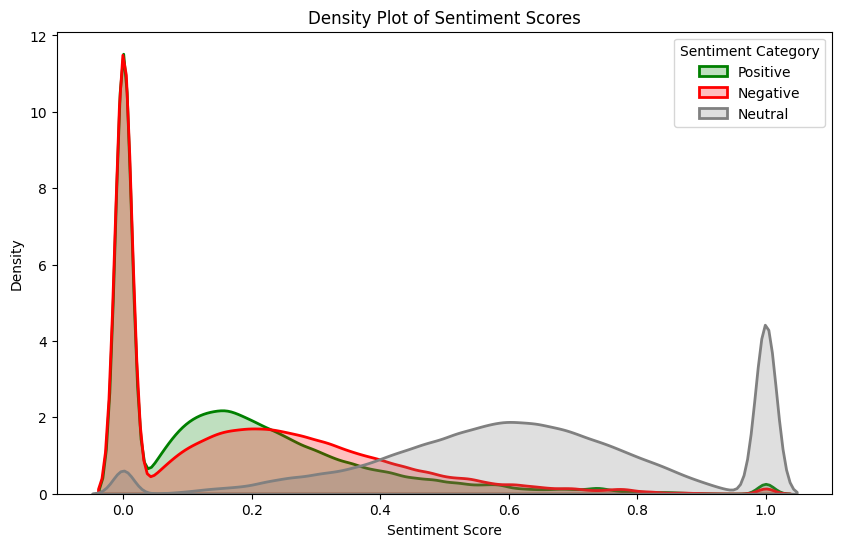

In [139]:
# Define the sentiment categories and corresponding colors
sentiment_categories = ["Positive", "Negative", "Neutral"]
colors = ['green', 'red', 'grey']

# Set up the plot
plt.figure(figsize=(10, 6))

# Iterate over sentiment categories and plot KDE
for category, color in zip(sentiment_categories, colors):
    sns.distplot(df[category], hist=False, kde=True,
                 bins=int(180/5), color=color,
                 hist_kws={'edgecolor': 'black'},
                 kde_kws={'shade': True, 'linewidth': 2}, label=category)

# Set plot labels and legend
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.title('Density Plot of Sentiment Scores')
plt.legend(title='Sentiment Category')

# Show the plot
plt.show()


### Visualization of the Sentiment Scores

C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\1808040337.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2496: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<AxesSubplot: xlabel='Compound', ylabel='Density'>

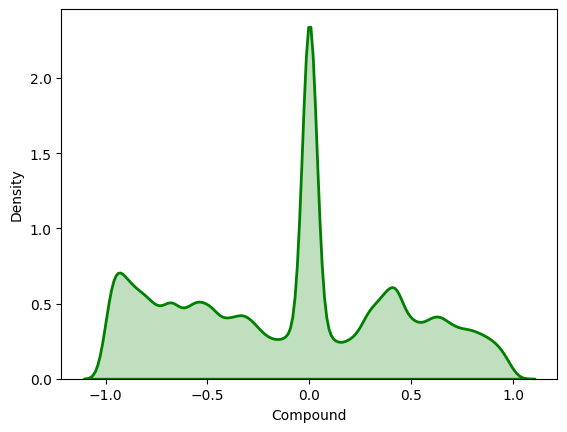

In [140]:
sns.distplot(df["Compound"], hist=False, kde=True, 
             bins=int(180/5), color = 'green', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'shade': True,'linewidth': 2})

### WordCloud of All Sentiments

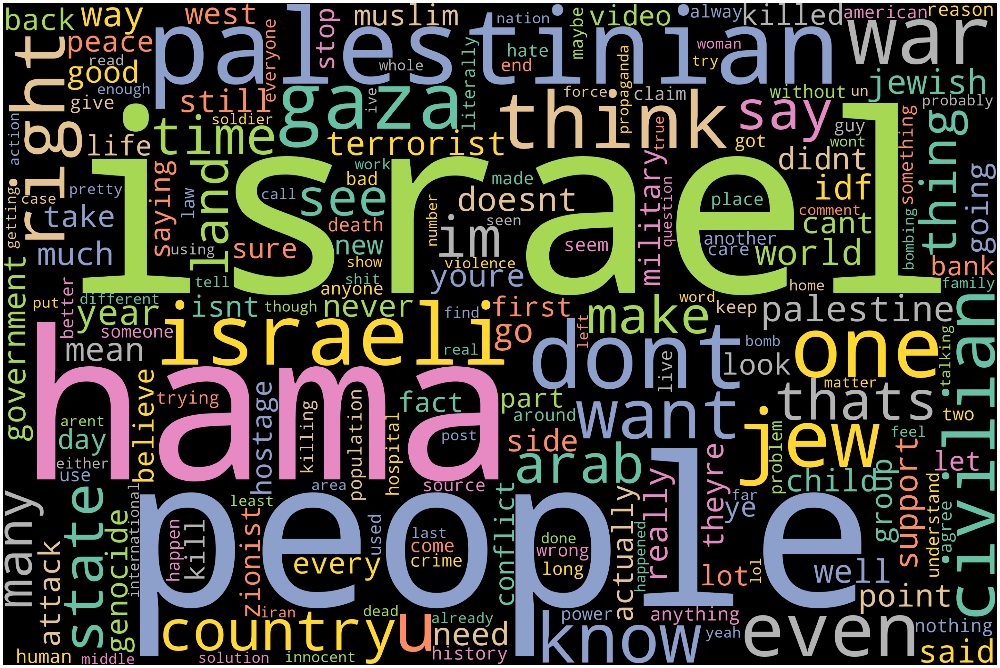

In [27]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df.clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Positive Sentiments

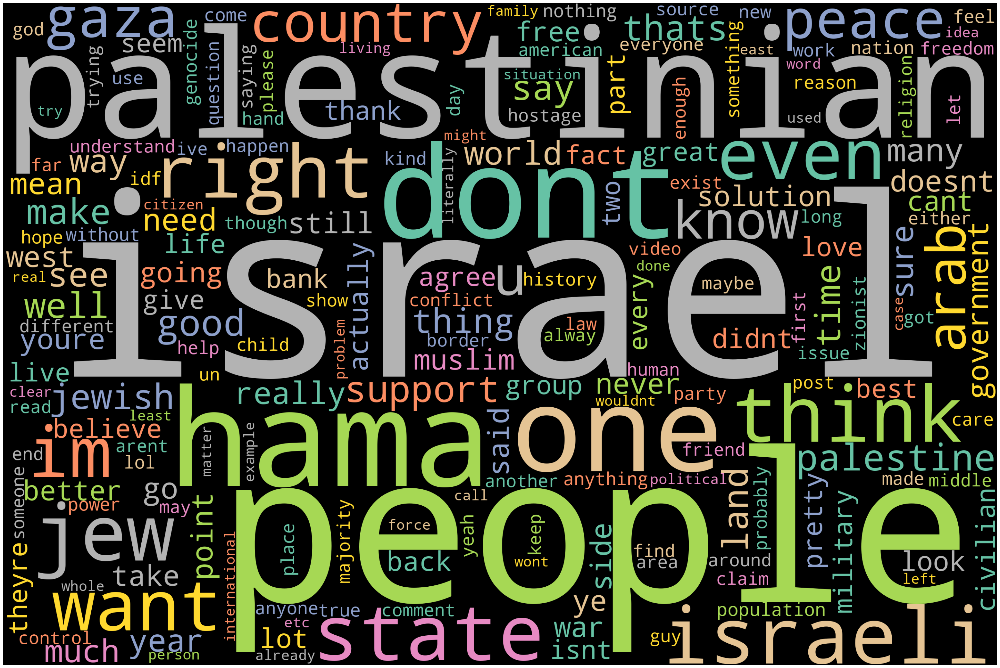

In [28]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Positive'].clean_text)
                                            
# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Neutral Sentiments

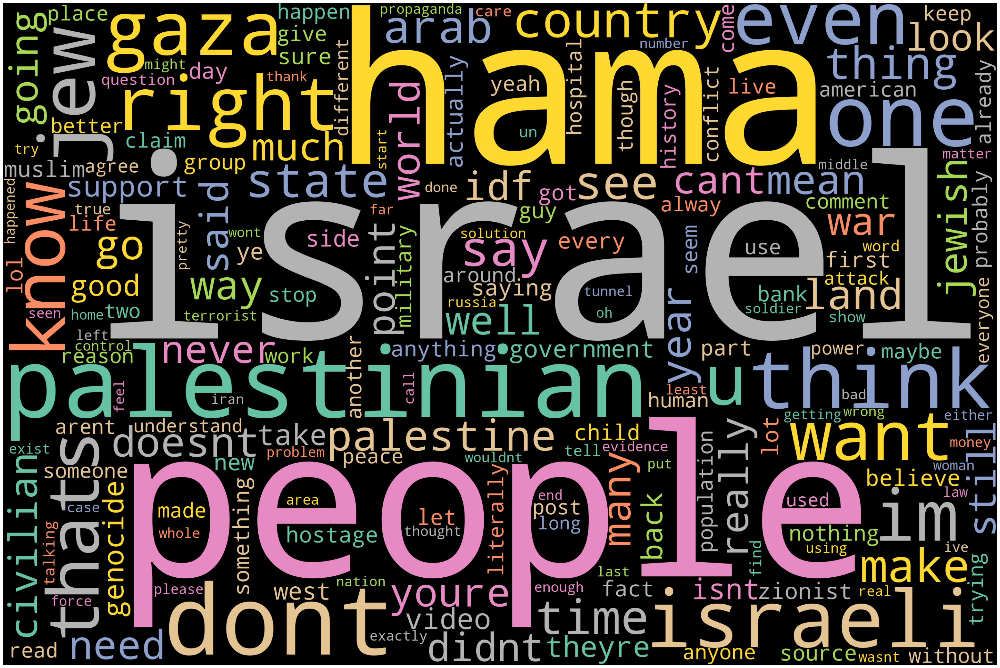

In [29]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Neutral'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


### WordCloud of Negative Sentiments

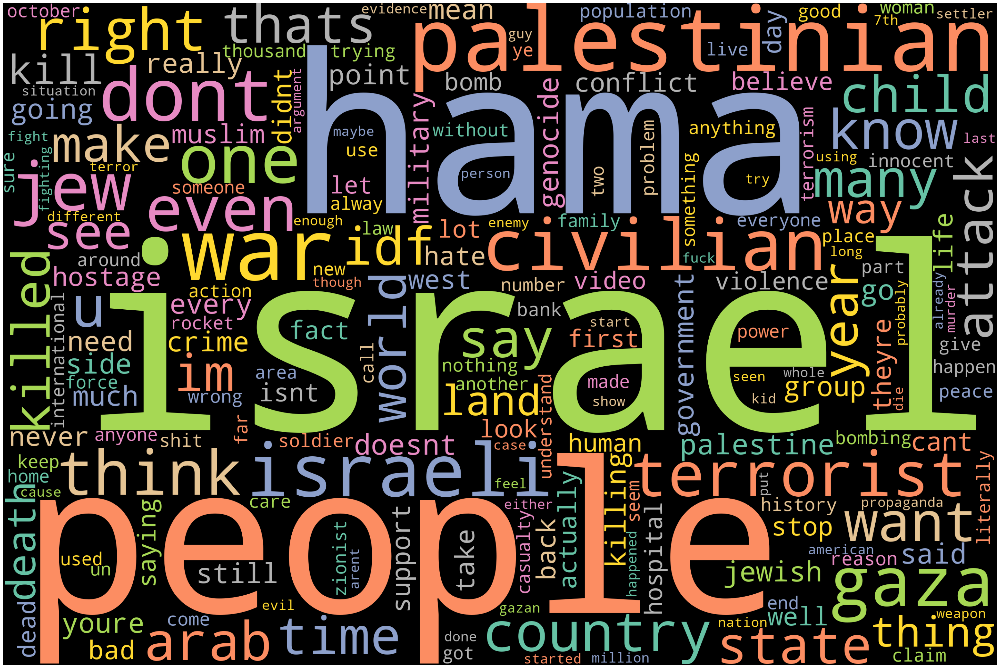

In [30]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Negative'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790055 entries, 0 to 790054
Data columns (total 31 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   comment_id                  790055 non-null  object 
 1   score                       790055 non-null  int64  
 2   self_text                   790051 non-null  object 
 3   subreddit                   790055 non-null  object 
 4   created_time                790055 non-null  object 
 5   post_id                     790055 non-null  object 
 6   author_name                 790055 non-null  object 
 7   controversiality            790055 non-null  int64  
 8   ups                         790055 non-null  int64  
 9   downs                       790055 non-null  int64  
 10  user_is_verified            790053 non-null  object 
 11  user_account_created_time   767121 non-null  object 
 12  user_awardee_karma          789965 non-null  float64
 13  user_awarder_k

In [32]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_thumbs_ups,post_total_awards_received,post_created_time,self_text_str,clean_text,Compound,Positive,Negative,Neutral,Category
0,kon47ca,1,Ok cute sentiment but also very short sighted ...,Palestine,2024-02-02 20:49:25,1ah01cs,Lolilio2,0,1,0,...,637,0,2024-02-02 09:44:49,Ok cute sentiment but also very short sighted ...,ok cute sentiment also short sighted blind hop...,-0.3818,0.131,0.158,0.712,Neutral
1,kon457r,1,"Yea Skor bars are nice, extremely underrated",worldnews,2024-02-02 20:49:05,1ah35xu,Poofshu,0,1,0,...,298,0,2024-02-02 13:02:45,"Yea Skor bars are nice, extremely underrated",yea skor bar nice extremely underrated,0.4215,0.359,0.000,0.641,Neutral
2,kon447n,1,Narrator: they did not.,IsraelPalestine,2024-02-02 20:48:56,1agztmw,Traditional-Fan-9315,0,1,0,...,38,0,2024-02-02 09:29:21,Narrator: they did not.,narrator,0.0000,0.000,0.000,1.000,Neutral
3,kon444j,1,Thank you! I was trying to find this,IsraelPalestine,2024-02-02 20:48:55,1ah6jnu,Ok_Presentation_2501,0,1,0,...,35,0,2024-02-02 15:38:58,Thank you! I was trying to find this,thank trying find,0.3612,0.556,0.000,0.444,Neutral
4,kon446a,1,Exactly. Get them together in a room at a know...,worldnews,2024-02-02 20:48:55,1ah91mc,TenaciousChicken,0,1,0,...,327,0,2024-02-02 17:25:16,Exactly. Get them together in a room at a know...,exactly get together room known location,0.0000,0.000,0.000,1.000,Neutral


# Positive or Negative Bias Detection

In [33]:
# Calculate the average sentiment scores for each subreddit
subreddit_sentiment = df.groupby('subreddit')[['Positive', 'Negative']].mean()

# Calculate the difference between positive and negative sentiment scores
subreddit_sentiment['Bias'] = subreddit_sentiment['Positive'] - subreddit_sentiment['Negative']

# Determine the direction of bias: Positive, Negative, or Neutral
def determine_bias_direction(bias):
    if bias > 0.01:  # You can adjust this threshold based on your dataset
        return 'Positive'
    elif bias < -0.01:  # You can adjust this threshold based on your dataset
        return 'Negative'
    else:
        return 'Neutral'

subreddit_sentiment['Bias Direction'] = subreddit_sentiment['Bias'].apply(determine_bias_direction)

# Sort subreddits based on bias in descending order
most_biased_subreddits = subreddit_sentiment.sort_values(by='Bias', ascending=False)

# Print or view the most biased subreddits with bias direction
print(most_biased_subreddits)


                       Positive  Negative      Bias Bias Direction
subreddit                                                         
AbruptChaos            0.183822  0.126139  0.057683       Positive
NonCredibleDefense     0.161596  0.146033  0.015563       Positive
CrazyFuckingVideos     0.165420  0.155127  0.010293       Positive
AskMiddleEast          0.166985  0.169441 -0.002456        Neutral
Palestine              0.176142  0.183951 -0.007809        Neutral
TerrifyingAsFuck       0.164307  0.174996 -0.010689       Negative
CombatFootage          0.161380  0.180348 -0.018968       Negative
ActualPublicFreakouts  0.165426  0.186162 -0.020736       Negative
IsraelPalestine        0.165173  0.187169 -0.021996       Negative
worldnews              0.162803  0.185806 -0.023003       Negative
PublicFreakout         0.163293  0.191000 -0.027707       Negative
worldnewsvideo         0.163688  0.197881 -0.034193       Negative
NoahGetTheBoat         0.168211  0.211886 -0.043675       Nega

In [34]:
# Step 3: Topic Modeling
vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['clean_text'])
lda_model = LatentDirichletAllocation(n_components=5, random_state=42, n_jobs=-1)  # Assuming 5 topics
lda_topic_matrix = lda_model.fit_transform(tfidf_matrix)

# Topic Modelling

In [143]:
# Get the feature names (words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Get the top words for each topic
n_top_words = 10  # You can adjust this number to display more or fewer words per topic
top_words_per_topic = []
for topic_idx, topic in enumerate(lda_model.components_):
    top_words_idx = topic.argsort()[:-n_top_words - 1:-1]
    top_words = [feature_names[i] for i in top_words_idx]
    top_words_per_topic.append(top_words)

# Print the topics and associated words
for topic_idx, top_words in enumerate(top_words_per_topic):
    print(f"Topic #{topic_idx + 1}:")
    print(", ".join(top_words))
    print()


Topic #1:
video, source, comment, post, yes, read, say, dont, said, know

Topic #2:
jew, arab, israel, people, palestinian, land, jewish, muslim, country, state

Topic #3:
israel, hamas, palestinian, people, dont, want, think, war, support, state

Topic #4:
hamas, civilian, israel, gaza, war, idf, child, people, terrorist, israeli

Topic #5:
like, lol, im, good, guy, dont, people, thats, shit, fuck



In [36]:
# Get the vocabulary indices for 'israel' and 'palestine' in your vectorizer
israel_word_index = vectorizer.vocabulary_['israel']
palestine_word_index = vectorizer.vocabulary_['palestine']

In [37]:
topic_term_distribution = lda_model.components_

In [145]:
israel_topic_index = topic_term_distribution[:, israel_word_index].argmax()
palestine_topic_index = topic_term_distribution[:, palestine_word_index].argmax()


1

In [39]:
# # Extract topic indices from the words associated with 'israel' and 'palestine'
# israel_topic_index = [topic_word[0] for topic_word in israel_topic_words]
# palestine_topic_index = [topic_word[0] for topic_word in palestine_topic_words]

# Geopolitical Stance Determination Using Dominant Topics and Sentiment Scores

In [180]:
from tqdm import tqdm
import time

df_list = []
df_to_split = df[['id', 'clean_text', 'Compound',
       'Positive', 'Negative', 'Neutral', 'Category']]

# Splitting the DataFrame into chunks of 50000 rows
for i in range(0, len(df_to_split), 50000):
    df_list.append(df_to_split.iloc[i:i+50000])

# Define the function to determine geopolitical stance
def determine_geopolitical_stance(row):
    sentiment_score = row['Compound']
    topic_distribution = lda_model.transform(vectorizer.transform([row['clean_text']]))[0]
    
    # Determine stance based on sentiment score and dominant topic
    if sentiment_score <= -0.5:
        return 'Against Israel/Palestine'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == israel_topic_index:
        return 'Supports Israel'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == palestine_topic_index:
        return 'Supports Palestine'
    else:
        return 'Neutral/Stance Not Clear'

# Apply the function to the DataFrame to determine geopolitical stances
tqdm.pandas()
start_time = time.time()
df_list[15]['geopolitical_stance'] = df_list[15].progress_apply(determine_geopolitical_stance, axis=1)
end_time = time.time()

# Calculate total execution time
execution_time = end_time - start_time
print(f"Total Execution Time: {execution_time} seconds")

# Estimate remaining time
remaining_rows = len(df_list[15]) - df_list[15]['geopolitical_stance'].count()
estimated_remaining_time = (execution_time / len(df_list[15])) * remaining_rows
print(f"Estimated Remaining Time: {estimated_remaining_time} seconds")



100%|██████████| 40055/40055 [03:11<00:00, 208.99it/s]

Total Execution Time: 191.6678249835968 seconds
Estimated Remaining Time: 0.0 seconds



C:\Users\Hp\AppData\Local\Temp\ipykernel_9952\1152260836.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [181]:
tooexcel = df_list[15][['id', 'geopolitical_stance']]
tooexcel.to_excel(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\geo.xlsx', index=0)

In [182]:
import pandas as pd

# Chemin du fichier Excel
file_path = r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\bismilah.xlsx'

# Lire chaque feuille Excel dans une liste de DataFrames
dfs = pd.read_excel(file_path, sheet_name=None)

# Concaténer tous les DataFrames en un seul
combined_df = pd.concat(dfs, ignore_index=True)

# Afficher les premières lignes du DataFrame combiné
print(combined_df.head())


   id                                         clean_text  Compound  Positive   
0   0  ok cute sentiment also short sighted blind hop...   -0.3818     0.131  \
1   1             yea skor bar nice extremely underrated    0.4215     0.359   
2   2                                           narrator    0.0000     0.000   
3   3                                  thank trying find    0.3612     0.556   
4   4           exactly get together room known location    0.0000     0.000   

   Negative  Neutral Category       geopolitical_stance  
0     0.158    0.712  Neutral  Neutral/Stance Not Clear  
1     0.000    0.641  Neutral  Neutral/Stance Not Clear  
2     0.000    1.000  Neutral  Neutral/Stance Not Clear  
3     0.000    0.444  Neutral  Neutral/Stance Not Clear  
4     0.000    1.000  Neutral  Neutral/Stance Not Clear  


In [183]:
stance_counts = combined_df['geopolitical_stance'].value_counts()
print("Geopolitical Stance Distribution:")
print(stance_counts)

Geopolitical Stance Distribution:
geopolitical_stance
Neutral/Stance Not Clear    500721
Against Israel/Palestine    223541
Supports Israel              42072
Supports Palestine           23721
Name: count, dtype: int64


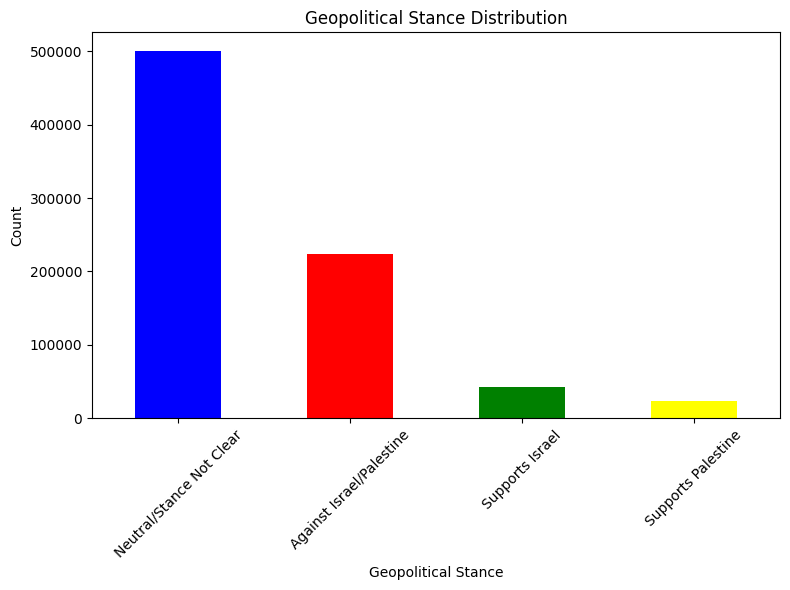

In [184]:
# Assuming 'geopolitical_stance' is a column in your DataFrame df
stance_counts = combined_df['geopolitical_stance'].value_counts()

# Create bar chart using DataFrame values
plt.figure(figsize=(8, 6))
stance_counts.plot(kind='bar', color=['blue', 'red', 'green', 'yellow'])
plt.xlabel('Geopolitical Stance')
plt.ylabel('Count')
plt.title('Geopolitical Stance Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()

# Show the chart
plt.show()

In [189]:
import plotly.express as px



# Comptez le nombre de chaque catégorie parmi les 1000 commentaires
stance_counts = combined_df['geopolitical_stance'].value_counts().reset_index()
stance_counts.columns = ['geopolitical_stance', 'Counts']  # Renommez les colonnes



# Créez un Pie Chart utilisant Plotly
fig = px.pie(stance_counts, values='Counts', names='geopolitical_stance', 
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Geopolitical_stance',
             hole=0.3, 
             color_discrete_sequence=px.colors.qualitative.Set1)

# Définir la couleur de fond du Pie Chart en gris foncé
fig.update_layout(paper_bgcolor='darkgrey')

# Afficher le Pie Chart
fig.show()


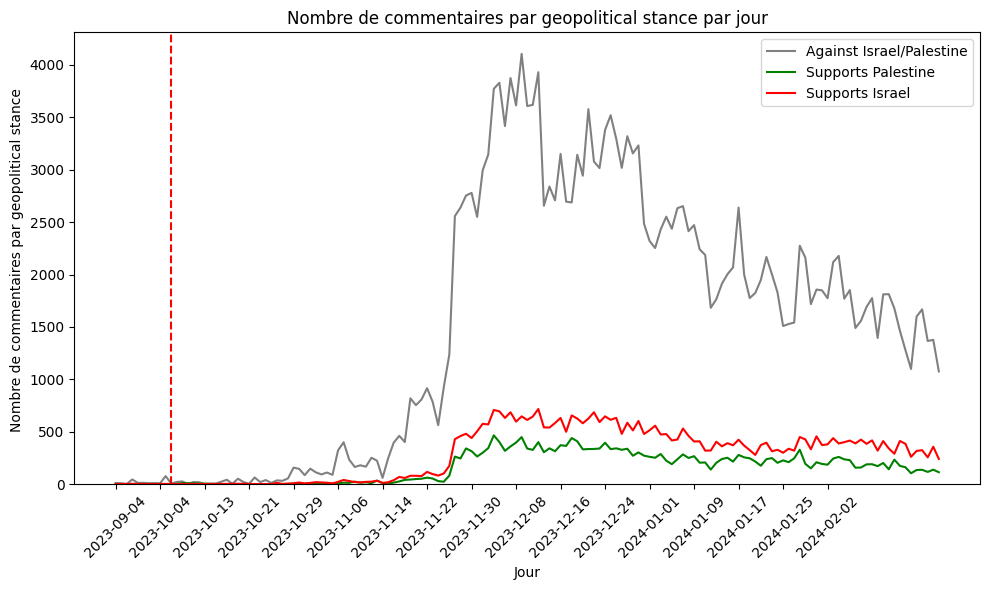

In [196]:

# df['geopolitical_stance'] = combined_df['geopolitical_stance']
'''==================nombre de comentaire par categorie de sentiment par jour========================='''
# Grouper les lignes par la colonne 'day' et compter le nombre correspondant pour chaque jour

positive_per_day = df[df['geopolitical_stance'] == 'Supports Palestine'].groupby('day').size()
negative_per_day = df[df['geopolitical_stance'] == 'Supports Israel'].groupby('day').size()
neutral_per_day = df[df['geopolitical_stance'] == 'Against Israel/Palestine'].groupby('day').size()
# Identifiez l'indice correspondant à la date du 7 octobre 2023
highlight_date = '2023-10-07'
highlight_index_p = positive_per_day.index.get_loc(highlight_date)
highlight_index_n = negative_per_day.index.get_loc(highlight_date)
highlight_index_ne = neutral_per_day.index.get_loc(highlight_date)

# Plotez le résultat
fig, ax = plt.subplots(figsize=(10, 6))

# Convertir les index en chaînes de caractères




x_values_ne = neutral_per_day.index.astype(str)
y_values_ne = neutral_per_day.values
ax.plot(x_values_ne, y_values_ne, color='grey', label='Against Israel/Palestine')

x_values_p = positive_per_day.index.astype(str)
y_values_p = positive_per_day.values
ax.plot(x_values_p, y_values_p, color='g', label='Supports Palestine')

x_values_n = negative_per_day.index.astype(str)
y_values_n = negative_per_day.values
ax.plot(x_values_n, y_values_n, color='r', label='Supports Israel')

# Ajouter des étiquettes et un titre au plot
ax.set_xlabel('Jour')
ax.set_ylabel('Nombre de commentaires par geopolitical stance ')
ax.set_title('Nombre de commentaires par geopolitical stance par jour')

# Ajouter une ligne verticale en pointillé pour la date du 7 octobre 2023
ax.axvline(x=highlight_index_p, linestyle='--', color='red')

ax.set_ylim(0)
# Afficher uniquement 10 dates sur l'axe x
n = 15
x_indices = range(0, len(x_values_p), len(x_values_p) // n)
x_labels = [x_values_p[i] for i in x_indices]
plt.xticks(x_indices, x_labels, rotation=45)

plt.tight_layout()  # Ajuster la mise en page pour s'assurer que tout est visible
plt.legend()  # Ajouter une légende
plt.show()


### Geopolitical Stance Distribution:

- **Neutral/Stance Not Clear:** The majority of the data falls into this category with a count of 286,000. This suggests that a significant portion of the dataset does not express a clear geopolitical stance on the Israel-Palestine issue.

- **Against Israel/Palestine:** There are 123,092 instances where the stance is against Israel/Palestine. This indicates a substantial portion of the data expressing a negative sentiment or opposition towards Israel, Palestine, or both.

- **Supports Palestine:** There are 13,911 instances where the stance supports Palestine. This represents a smaller but notable segment of the data that expresses support for the Palestinian side of the conflict.

- **Supports Israel:** There are 13,722 instances where the stance supports Israel. Similar to supporting Palestine, supporting Israel is also expressed by a smaller but significant portion of the dataset.

In summary, the majority of the data does not express a clear stance. Among those that do, there is a considerable diversity of opinions, with a slightly higher number of instances leaning against Israel/Palestine.


# Inferences

### **Why Neutral or Unclear Stance is Disturbing:**

1. **Humanitarian Crisis:** The war has led to a significant humanitarian crisis, with a large number of civilian casualties, including children. A neutral stance might indicate a lack of active engagement for a peaceful resolution, potentially perpetuating the crisis.

2. **Potential for Change:** A neutral stance might imply a failure to actively work towards a resolution. With so many lives at stake, not actively supporting efforts for peace could be seen as a missed opportunity to make a positive impact.

3. **Moral Responsibility:** Some argue that in the face of significant human suffering, individuals and nations have a moral responsibility to take a stand against violence and advocate for peaceful solutions. A neutral stance might be perceived as shirking this responsibility.

4. **Perpetuation of War:** A lack of active engagement might inadvertently support the status quo, allowing the war to continue without significant international pressure for resolution. This can lead to more lives being lost and the prolongation of suffering.

5. **Missed Opportunities for Diplomacy:** International pressure and diplomacy can play a crucial role in war resolution. By not picking a side, opportunities for diplomatic efforts and negotiations might be missed, hindering the chances of finding a peaceful resolution.

6. **Failure to Address Root Causes:** Taking a neutral stance means avoiding addressing the underlying issues that fuel the war, such as territorial disputes and human rights violations. Without addressing these root causes, long-term peace and stability are impossible to achieve.

7. **Lack of Moral Clarity:** In situations with clear human rights violations, a neutral stance cab be seen as a lack of moral clarity and a failure to stand up against injustice.

In summary, a neutral or complacent stance in the Israel-Palestine war might be perceived as problematic because it can contribute to the continuation of the war and the suffering of those involved. Many advocate for active engagement, dialogue, and efforts toward a peaceful resolution to prevent further loss of lives, especially among vulnerable populations like children.


In [191]:

# df['id'] = df.index
df.columns
combined_df.columns

Index(['id', 'clean_text', 'Compound', 'Positive', 'Negative', 'Neutral',
       'Category', 'geopolitical_stance'],
      dtype='object')

In [55]:
import pandas as pd
from tqdm import tqdm

# Assuming df is defined earlier in your code

df_list = []
df_to_split = df[['id', 'clean_text', 'Compound',
       'Positive', 'Negative', 'Neutral', 'Category']]

# Splitting the DataFrame into chunks of 50000 rows
for i in range(0, len(df_to_split), 50000):
    df_list.append(df_to_split.iloc[i:i+50000])

# Saving each chunk to a separate sheet in the same Excel file
with pd.ExcelWriter(r'C:\Users\Hp\OneDrive - Université Mohammed VI Polytechnique\CI2A\SCOLAIRE\S7\Analytics EDGE\PROJET\Palestine\bismilah.xlsx', engine='xlsxwriter') as writer:
    for i, chunk in enumerate(tqdm(df_list)):
        chunk.to_excel(writer, sheet_name=f'Feuille{i+1}', index=False)

  6%|▋         | 1/16 [00:07<01:56,  7.79s/it]Exception ignored in: <function ZipFile.__del__ at 0x000001E7475AF8B0>
Traceback (most recent call last):
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.9_3.9.3568.0_x64__qbz5n2kfra8p0\lib\zipfile.py", line 1816, in __del__
    self.close()
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.9_3.9.3568.0_x64__qbz5n2kfra8p0\lib\zipfile.py", line 1833, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file
100%|██████████| 16/16 [02:20<00:00,  8.75s/it]
